<div class="alert alert-block alert-info"><b>Fundamentals of scRNA-seq analysis in Python</b><br>
Lecture 4, 02-01-2024<br>
This notebook is part the course 580.447/647 Computational Stem Cell Biology taught by Patrick Cahan at Johns Hopkins University in Winter/Spring 2024. Many parts of this tutorial are derived from the sources listed in the Resources section at the end of this notebook.</div> 

### Objectives for today
At the end of class, students will be familiar with:
1. How to use Colab to interact with Python interpreter
2. How to transfer files to/from Colab
3. How to install packages on Colab
4. Basics of Scanpy
	1. annData
	2. loading and saving files
	3. getting var info
	4. getting more help: scanpy docs, tutorials, ChatGPT
5. Quality control
6. Normalization
9. Dimension reduction
10. Cell-cell distance
11. Unsupervised clustering
12. Differential gene expression
13. Cell annotation

### What we did last time
Last time we discussed gene expression, how to measure gene expression in lots of single cells, noted that this is an imperfect surrogate for cell state/identity

### Outline for today
Here is what we are going to talk about:
1. How this is going to work, and what we expect from you, and what you can expect from us
2. Nature of the data: some biological motivation + CellRanger output
4. Intro to Colab/Jupyter
5. How to analyze scRNAseq data
6. Format for HW1 -- What you should turn in, its format

### How this will work
How this is going to work today. We will break things down into 2-5 minutes bites, where I will tell you about the step, then I'll stop and give you a few minutes to try it on your own. If you would like, please feel free to pair up, at most groups of 3 for this BUT feel no obligation to do so!!!
Also, I am not going to ask anyone to show us your work, answer questions, etc. Today is just about getting you hands on experience with these types of analyses so that you are prepared for the first Homework.


### Background on the data
Let's start with some background + motivation for the data set that we are going to analyze: hematopoietic cells from peripheral blood.

#### Hematopoiesis 

<figure>
    <img src="./img/Hematopoiesis.png" alt="Hematopoiesis" width="600">
    <figcaption>Traditional model of hematopoiesis. Image from <a href="https://onlinelibrary.wiley.com/doi/book/10.1002/9781119235293">Slack 2017</a></figcaption>
</figure>

These cells are produced in the bone marrow and then move into the vascular so that they can move about the body and perform their functions (transport oxygen, clot, do adaptive and innate immune things). 

#### Peripheral blood mononuclear cells (PBMCs)
It is possible to enrich for what are called PBMCs from vein by subjecting sample to density gradient centrifugation. This enrichs for cells that have one, round nucleus, and excludes cells that do not have nuclie, or that have multi-lobed structures. PBMCs typically contain:

> ... several classes of immune cells, including T cells (\~70%), B cells (\~15%), monocytes (\~5%), dendritic cells (\~1%) and natural killer (NK) cells (~10%)
> <br>    --  [Sen et al 2019](https://www.frontiersin.org/articles/10.3389/fmolb.2017.00096/)

and

> ... The CD3+ lymphocytes are composed of CD4+ and CD8+ T cells, roughly in a 2:1 ratio.
> <br>    -- [Kleiveland, 2015](https://library.oapen.org/bitstream/handle/20.500.12657/28028/1001968.pdf?seque)


### Bio question(s) for the day
- What does scRNAseq estimate as their relative proportion? and how does it compare to the estimate above?
- To what extent does cell type composition vary between samples?
- Are there other genes that are better at distinguishing between these populations than marker genes listed below? 
- How many cells do you need to reliably detect a sub-population?

### Data
10X Genomics scRNA-seq on human PBMCs 
##### Sample 1
- http://cf.10xgenomics.com/samples/cell-exp/1.1.0/pbmc3k/pbmc3k_filtered_gene_bc_matrices.tar.gz
##### Sample 2
- https://colab.research.google.com/corgiredirector?site=https%3A%2F%2Fcf.10xgenomics.com%2Fsamples%2Fcell-exp%2F6.1.0%2F20k_PBMC_3p_HT_nextgem_Chromium_X%2F20k_PBMC_3p_HT_nextgem_Chromium_X_filtered_feature_bc_matrix.h5
- 20k Human PBMCs, 3’ HT v3.1, Chromium X
- Sourced from a healthy female donor
- 23,837 cells
- 35,000 reads per cell
- Filtered data in .h5 format

### CellRanger
CellRanger is the program that converts sequencing reads into gene expression counts.

<figure>
    <img src="./img/cellranger_flow_1.png" alt="CellRanger flowchart 1" width="600">
    <figcaption>CellRanger flow chart from <a href="https://www.10xgenomics.com/support/software/cell-ranger/latest/algorithms-overview/cr-gex-algorithm">10X genomics</a></figcaption>
</figure>


Here is a more detailed glimpse of what is happening here:

<figure>
    <img src="img/cellranger_flow_2.png" alt="CellRanger flowchart 2" width="400">
    <figcaption>CellRanger flow chart 2 from <a href="https://www.10xgenomics.com/support/software/cell-ranger/latest/algorithms-overview/cr-gex-algorithm">10X genomics</a></figcaption>
</figure>

<figure>
    <img src="img/cellranger_mapping.jpeg" alt="CellRanger mapping" width="600">
    <figcaption>CellRanger mapping from <a href="https://www.10xgenomics.com/support/software/cell-ranger/latest/algorithms-overview/cr-gex-algorithm">10X genomics</a></figcaption>
</figure>

### Jupyter basics
Connect to Colab: https://colab.research.google.com/

#### Install scanpy

In [ ]:
!pip install scanpy scipy umap-learn leidenalg

#### Fetch data file(s)

In [ ]:
# wget for linux/unix
# !wget https://cf.10xgenomics.com/samples/cell-exp/3.0.0/pbmc_10k_v3/pbmc_10k_v3_filtered_feature_bc_matrix.h5
# !wget https://cf.10xgenomics.com/samples/cell-exp/6.1.0/20k_PBMC_3p_HT_nextgem_Chromium_X/20k_PBMC_3p_HT_nextgem_Chromium_X_filtered_feature_bc_matrix.h5

# curl for macOS; i have no clue what to use for Windows
!curl https://cf.10xgenomics.com/samples/cell-exp/3.0.0/pbmc_10k_v3/pbmc_10k_v3_filtered_feature_bc_matrix.h5 -o pbmc_10k_v3_filtered_feature_bc_matrix.h5
!curl https://cf.10xgenomics.com/samples/cell-exp/6.1.0/20k_PBMC_3p_HT_nextgem_Chromium_X/20k_PBMC_3p_HT_nextgem_Chromium_X_filtered_feature_bc_matrix.h5 -o 20k_PBMC_3p_HT_nextgem_Chromium_X_filtered_feature_bc_matrix.h5

### Scanpy basics
#### load packages



In [3]:
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
plt.rcParams['figure.dpi'] = 300
sc.logging.print_header()

scanpy==1.9.8 anndata==0.10.5.post1 umap==0.5.5 numpy==1.26.3 scipy==1.12.0 pandas==2.2.0 scikit-learn==1.4.0 statsmodels==0.14.1 igraph==0.11.3 pynndescent==0.5.11


#### Load Sample 1

In [4]:
# I have stored these data files in the directory data/ 
ad10f = sc.read_10x_h5("data/pbmc_10k_v3_filtered_feature_bc_matrix.h5")
# If you stored yours in the cwd on Colab, you should uncomment and run this line instead to load your data:
# ad10f = sc.read_10x_h5("pbmc_10k_v3_filtered_feature_bc_matrix.h5")

#### Getting information about functions
You can get info about functions using
> help(functionName)

or

> ?functionName


In [5]:
?sc.read_10x_h5

Signature:
sc.read_10x_h5(
    filename: 'Union[str, Path]',
    genome: 'Optional[str]' = None,
    gex_only: 'bool' = True,
    backup_url: 'Optional[str]' = None,
) -> 'AnnData'
Docstring:
Read 10x-Genomics-formatted hdf5 file.

Parameters
----------
filename : 'Union[str, Path]'
    Path to a 10x hdf5 file.
genome : 'Optional[str]', optional (default: None)
    Filter expression to genes within this genome. For legacy 10x h5
    files, this must be provided if the data contains more than one genome.
gex_only : 'bool', optional (default: True)
    Only keep 'Gene Expression' data and ignore other feature types,
    e.g. 'Antibody Capture', 'CRISPR Guide Capture', or 'Custom'
backup_url : 'Optional[str]', optional (default: None)
    Retrieve the file from an URL if not present on disk.

Returns
-------
Annotated data matrix, where observations/cells are named by their
barcode and variables/genes by gene name. Stores the following information:

:attr:`~anndata.AnnData.X`
    The data

#### Inspecting the data -- gross properties

In [6]:
print(ad10f)

AnnData object with n_obs × n_vars = 11769 × 33538
    var: 'gene_ids', 'feature_types', 'genome'


In [7]:
ad10f.shape

(11769, 33538)

In [8]:
type(ad10f)

anndata._core.anndata.AnnData

#### AnnData
AnnData is a Python package that defines a data structure designed to efficiently store large data sets like scRNA-seq. 

<figure>
    <img src="img/anndata_schema.svg" alt="AnnData" width="600">
    <figcaption>AnnData schema. See Resouces below for link to documentation</figcaption>
</figure>


#### Slicing or subsetting
Get a small subset of the data


In [9]:
ncells = 3
ngenes = 4
randGenes = np.random.choice(ad10f.var_names, size=ngenes, replace=False)
randCells = np.random.choice(ad10f.obs_names, size=ncells, replace=False)

In [10]:
print(randCells)

['CAGCAATGTGAGATCG-1' 'TCCGAAATCGAGTTGT-1' 'CACGGGTCACCAGGTC-1']


In [11]:
print(randGenes)

['FADS6' 'NLRP13' 'KRTAP2-1' 'SSTR5']


In [12]:
newAnndata = ad10f[ randCells ]
newAnndata

View of AnnData object with n_obs × n_vars = 3 × 33538
    var: 'gene_ids', 'feature_types', 'genome'

In [13]:
ad10f[ randGenes ]

KeyError: "Values ['FADS6', 'NLRP13', 'KRTAP2-1', 'SSTR5'], from ['FADS6', 'NLRP13', 'KRTAP2-1', 'SSTR5'], are not valid obs/ var names or indices."

In [14]:
ad10f[:, randGenes ]

InvalidIndexError: Reindexing only valid with uniquely valued Index objects

In [15]:
gname_counts = ad10f.var_names.value_counts()
np.any(gname_counts>1)

True

In [16]:
duplicates = gname_counts[gname_counts > 1]
print(duplicates)

PDE11A       2
SCO2         2
LINC01505    2
PRSS50       2
ATXN7        2
EMG1         2
CYB561D2     2
LINC01238    2
CCDC39       2
TXNRD3NB     2
ABCF2        2
HSPA14       2
TBCE         2
SOD2         2
RGS5         2
TMSB15B      2
MATR3        2
PINX1        2
POLR2J3      2
DIABLO       2
LINC02203    2
IGF2         2
H2BFS        2
COG8         2
Name: count, dtype: int64


In [17]:
ad10f.var_names_make_unique()
ad10f[:, randGenes ]

View of AnnData object with n_obs × n_vars = 11769 × 4
    var: 'gene_ids', 'feature_types', 'genome'

In [18]:
ad10f[randCells, randGenes ]

View of AnnData object with n_obs × n_vars = 3 × 4
    var: 'gene_ids', 'feature_types', 'genome'

<div class="alert alert-block alert-success"><b>Views</b><br>
Views are pointers to memory where original anndata is stored. They are _not_ copies of the variable. 
</div>

#### Gene counts
So, where is the data?

In [19]:
ad10f[randCells, randGenes ].X

<3x4 sparse matrix of type '<class 'numpy.float32'>'
	with 0 stored elements in Compressed Sparse Row format>

#### meta data
for cells, see .obs

for genesm see .var

In [20]:
print(ad10f.obs.columns)

Index([], dtype='object')


In [21]:
ad10f.obs['sample_name'] = "sample_1"
print(ad10f.obs.columns)

Index(['sample_name'], dtype='object')


In [22]:
print(ad10f[randCells].obs)

                   sample_name
CAGCAATGTGAGATCG-1    sample_1
TCCGAAATCGAGTTGT-1    sample_1
CACGGGTCACCAGGTC-1    sample_1


In [23]:
print(ad10f.var.columns)

Index(['gene_ids', 'feature_types', 'genome'], dtype='object')


In [24]:
print(ad10f[:,randGenes].var)

                 gene_ids    feature_types  genome
FADS6     ENSG00000172782  Gene Expression  GRCh38
NLRP13    ENSG00000173572  Gene Expression  GRCh38
KRTAP2-1  ENSG00000212725  Gene Expression  GRCh38
SSTR5     ENSG00000162009  Gene Expression  GRCh38


In [23]:
print(ad10f.var[randGenes,:])

InvalidIndexError: (array(['PREP', 'AL589986.1', 'AC245140.3', 'AL445228.1'], dtype=object), slice(None, None, None))

#### .loc
Use .loc function to index based with labels

In [25]:
print(ad10f.var.loc[randGenes])

                 gene_ids    feature_types  genome
FADS6     ENSG00000172782  Gene Expression  GRCh38
NLRP13    ENSG00000173572  Gene Expression  GRCh38
KRTAP2-1  ENSG00000212725  Gene Expression  GRCh38
SSTR5     ENSG00000162009  Gene Expression  GRCh38


### Quality Control (QC) 
We want to find putative doublets and low quality cell barcodes and exclude them.
We also can remove genes that are not detected in vast majority of cells. pp.calculate_qc_metrics() will calcualte a set of metrics for both obs and var that can be used for QC filtering. It can also take inputs to specify other, custom metrics to compute. Below, we use it to compute the fraction total umis in each cell that are mitochondrially encoded or that code for ribosomal genes.

In [26]:
ad10f.var['mt'] = ad10f.var_names.str.startswith('MT-')
ribo_prefix = ("RPS","RPL")
ad10f.var['ribo'] = ad10f.var_names.str.startswith(ribo_prefix)
sc.pp.calculate_qc_metrics(ad10f, qc_vars=['mt','ribo'], percent_top=None, log1p=False, inplace=True)

#### Visualize
Take a look some typical QC values across these data

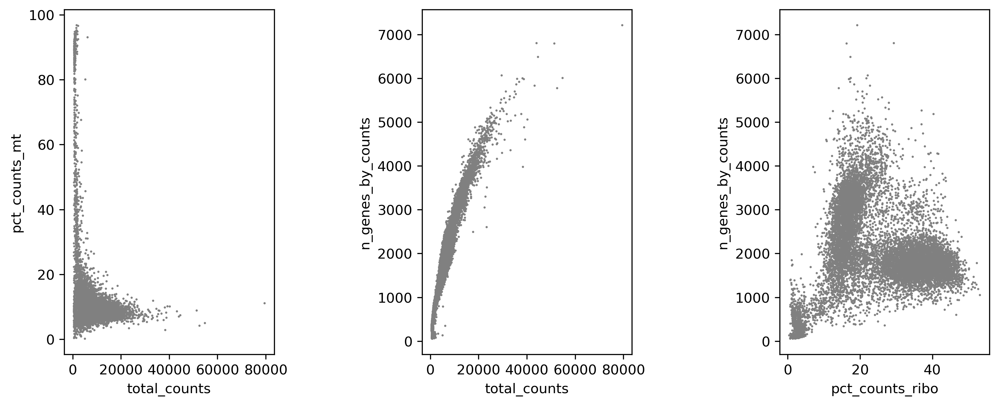

In [27]:
adClean = ad10f.copy()

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(10,4), gridspec_kw={'wspace':0.25}, constrained_layout=True)
ax1_dict = sc.pl.scatter(adClean, x='total_counts', y='pct_counts_mt', ax=ax1, show=False)
ax2_dict = sc.pl.scatter(adClean, x='total_counts', y='n_genes_by_counts',ax=ax2, show=False)
ax3_dict = sc.pl.scatter(adClean, x='pct_counts_ribo', y='n_genes_by_counts',ax=ax3, show=False)
plt.show()

Now, do the filtering. First, keep only cells with < 20% mitochonrially encoded gene total UMIs

In [28]:
adClean = adClean[adClean.obs['pct_counts_mt']<20,:].copy()
adClean.n_obs

11047

Now filter based on total number of genes detected (at least 500) and total number of counts (less than 30,000). And keep genes that are detected in at least 3 cells.

In [29]:
sc.pp.filter_cells(adClean, min_genes=500)
sc.pp.filter_cells(adClean, max_counts=30000)
sc.pp.filter_genes(adClean, min_cells=3)
adClean.shape

(10891, 20181)

### Normalization
Simple library size scaling, then log transform. There are many other ways to do correct for cell-to-cell technical variation, for example different cell lysis efficiencies, but this method is good enough.

In [83]:
adNorm = adClean.copy()
sc.pp.normalize_total(adNorm , target_sum=1e4)
sc.pp.log1p(adNorm )

### Highly variable genes (HVG)
It is common practice to limit some parts of analysis to those variables/genes that exhibit some degree of variation in their values across the data. We call these highly variable genes, or HVG for short. To find these, calculate some gene statistics, which when combined with thresholds below, determine which genes are considered HVG. These metrics are mean expression and dispersion (variance / mean). Variance is defined as the expected squared deviation of gene expression. The normalized dispersion is calculated by scaling based on a bin of mean expression.

In [84]:
sc.pp.highly_variable_genes(adNorm , min_mean=0.0125, max_mean=6, min_disp=0.25)
adNorm.var

,gene_ids,feature_types,genome,mt,ribo,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,n_cells,highly_variable,means,dispersions,dispersions_norm
AL627309.1,ENSG00000238009,Gene Expression,GRCh38,False,False,60,0.005183,99.490186,61.0,60,False,0.007519,0.595591,-0.001919
AL627309.3,ENSG00000239945,Gene Expression,GRCh38,False,False,4,0.000340,99.966012,4.0,4,False,0.000389,0.144284,-1.366927
AL669831.5,ENSG00000237491,Gene Expression,GRCh38,False,False,679,0.062367,94.230606,734.0,665,False,0.077585,0.586329,-0.029932
FAM87B,ENSG00000177757,Gene Expression,GRCh38,False,False,13,0.001190,99.889540,14.0,13,False,0.001139,0.169543,-1.290532
LINC00115,ENSG00000225880,Gene Expression,GRCh38,False,False,350,0.031269,97.026085,368.0,337,False,0.038579,0.459107,-0.414723
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AC011043.1,ENSG00000276256,Gene Expression,GRCh38,False,False,77,0.006882,99.345739,81.0,74,False,0.010262,0.738345,0.429851
AL592183.1,ENSG00000273748,Gene Expression,GRCh38,False,False,32,0.002719,99.728099,32.0,30,False,0.003977,0.799225,0.613985
AC007325.4,ENSG00000278817,Gene Expression,GRCh38,False,False,239,0.020902,97.969241,246.0,233,False,0.023936,0.329110,-0.807909
AL354822.1,ENSG00000278384,Gene Expression,GRCh38,False,False,319,0.028210,97.289489,332.0,303,False,0.038089,0.594378,-0.005588


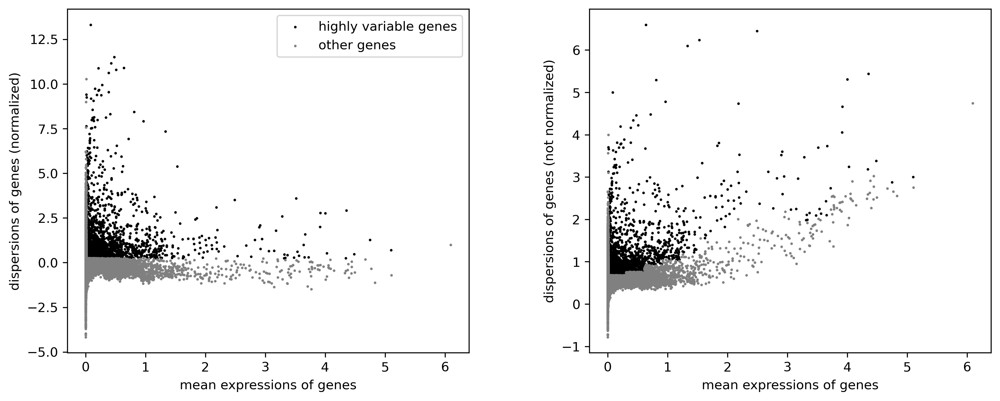

In [85]:
sc.pl.highly_variable_genes(adNorm)

### PCA
There are two facts that make PCA a good tool for analzying scRNAseq data:
1.) genes are expressed in coordinated fashion, meaning that many have correlated expression patterns. 
2.) Second scRNAseq data is noisy.

PCA allows us to reduce a high dimensional data set into a lower dimension in which much of the total variation is maintained. To understand PCA, you need to know linear algebra. In essence, it identifies sets of linear combinations of genes in such a way that they uncorrelated and explain most variation in the data. The function call does the following:

- compute the covariance matrix (correlation between each pair of genes)
- finding eigenvectors (directions of axes that maximize that variance), orthogonal to each other

Later, we find select a number num_pcs as the number of PCs that contribute most to the total variation on our data. We use these PCs to compute cell-to-cell distances for embedding and for clustering of cells. 

In [86]:
sc.tl.pca(adNorm , use_highly_variable=True)

### Marker genes
Here PBMC cell types and some genes that have been used to identify them:<br>
**Monocytes**: CD14, CD68, LYZ<br>
**Dendritic**: CLEC4C, FLT3<br>
**NK cells**: GNLY, NCAM1<br>
**B cells**: CD19, CD79A, CD79B<br>
**T cells**: CD3D, CD3E, TRAC, TRBC<br>


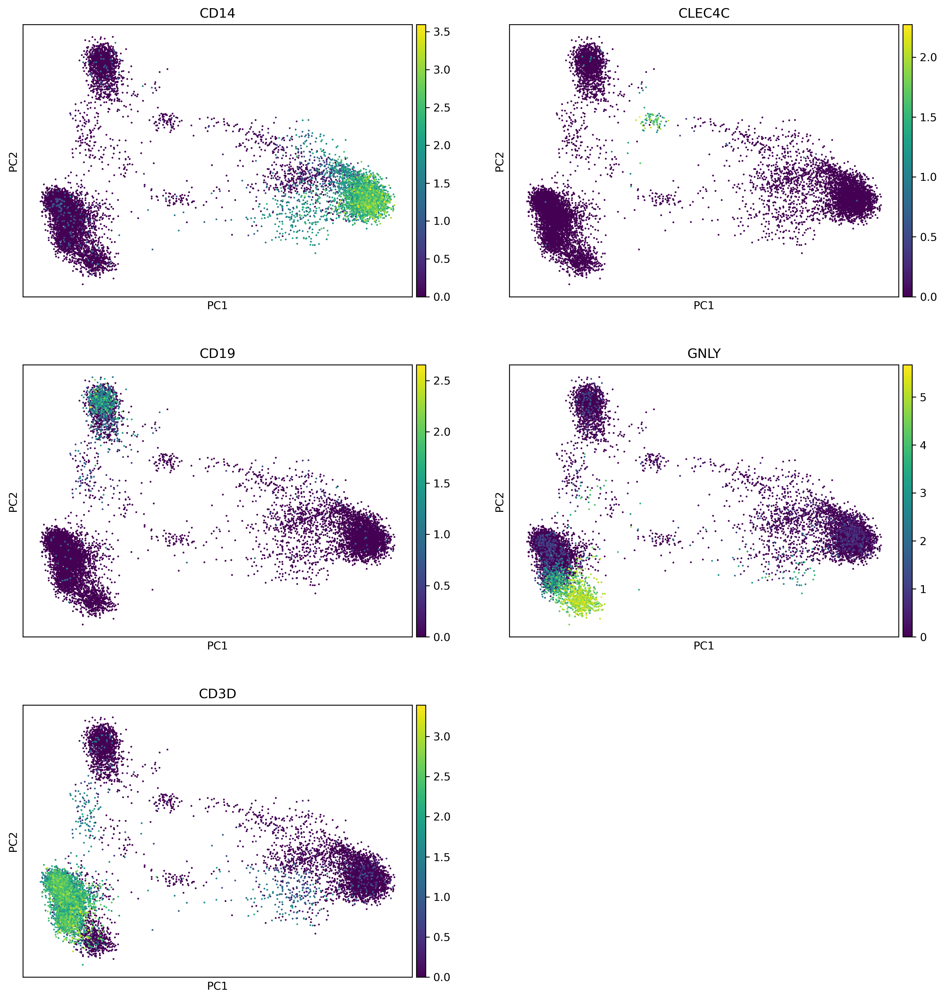

In [87]:
markerGenes = ['CD14','CLEC4C', 'CD19',  'GNLY', 'CD3D']
sc.pl.pca(adNorm , color=markerGenes, ncols=2)

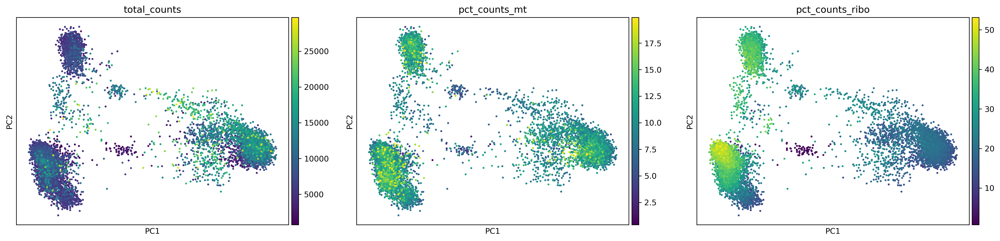

In [35]:
sc.pl.pca(adNorm, color=['total_counts', 'pct_counts_mt', 'pct_counts_ribo'], s=25,ncols=3)

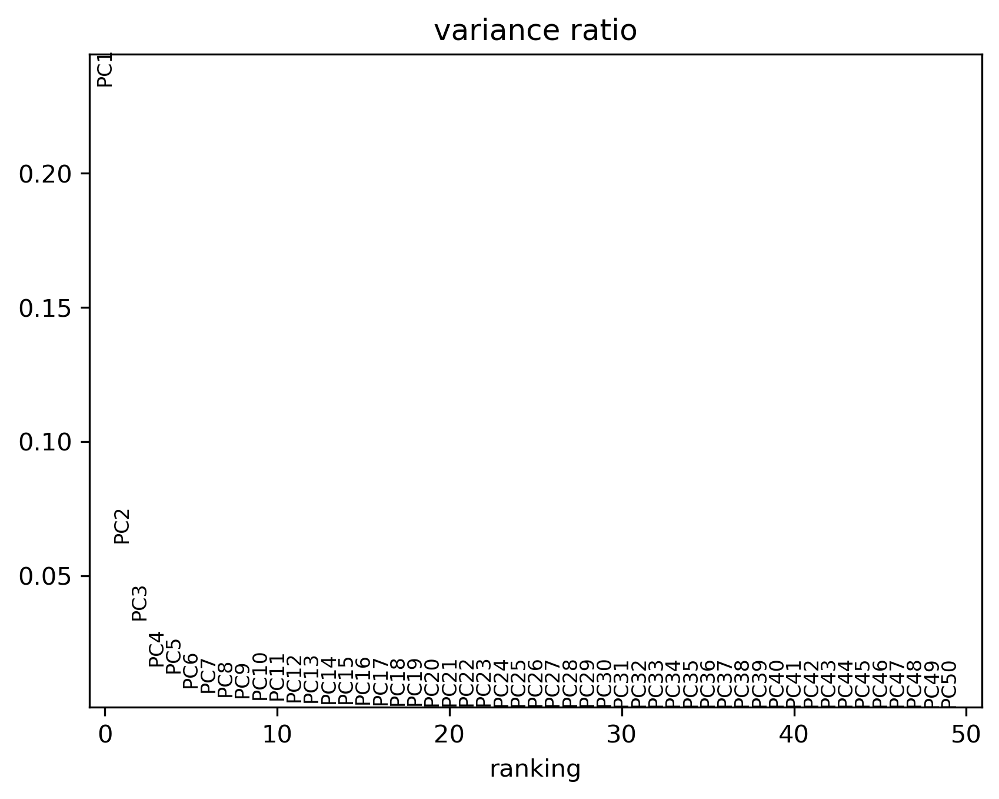

In [36]:
sc.pl.pca_variance_ratio(adNorm, 50)

#### PCA Loadings
Where are PCs (i.e. loadings -- the contribution of each gene to each PC) stored in anndata? .varm (see figure of anndata way above)?

In [88]:
np.shape(adNorm.varm["PCs"])

(20181, 50)

Where are the PC values of each cell (i.e. the PC scores) stored in anndata? .obsm

In [89]:
np.shape(adNorm.obsm["X_pca"])

(10891, 50)

#### kNN cell-cell distances
The k-nearest neighbor graph generates an adjacency matrix by finding, for each cell, the k cells that are closest to it. This helps to reduce noise in computing cell-cell distances or similarities and is important for embedding the cells in a 2D space, and for community detection algorithms. Two arguments are n_neighbors, or _k_, and the number of PCs to use when computing cell-cell distances. 

In [90]:
n_neighbors = 20
n_pcs = 10
sc.pp.neighbors(adNorm, n_neighbors=n_neighbors, n_pcs=n_pcs)

### Visualization of cell-cell similarities 

#### UMAP embedding
This an elaboration on the t-SNE embedding approach. Both of these methods try to project cells into a reduced (typically 2) dimensional coordinate system while maintaining both the global and local structure of the high dimensional space of the data (i.e. cells that are distant from each other high dimensions should still be distant in the reduced embedding; same is true for cells that are near each other). The distances come from the kNN graph.

In [91]:
sc.tl.umap(adNorm, 0.25)

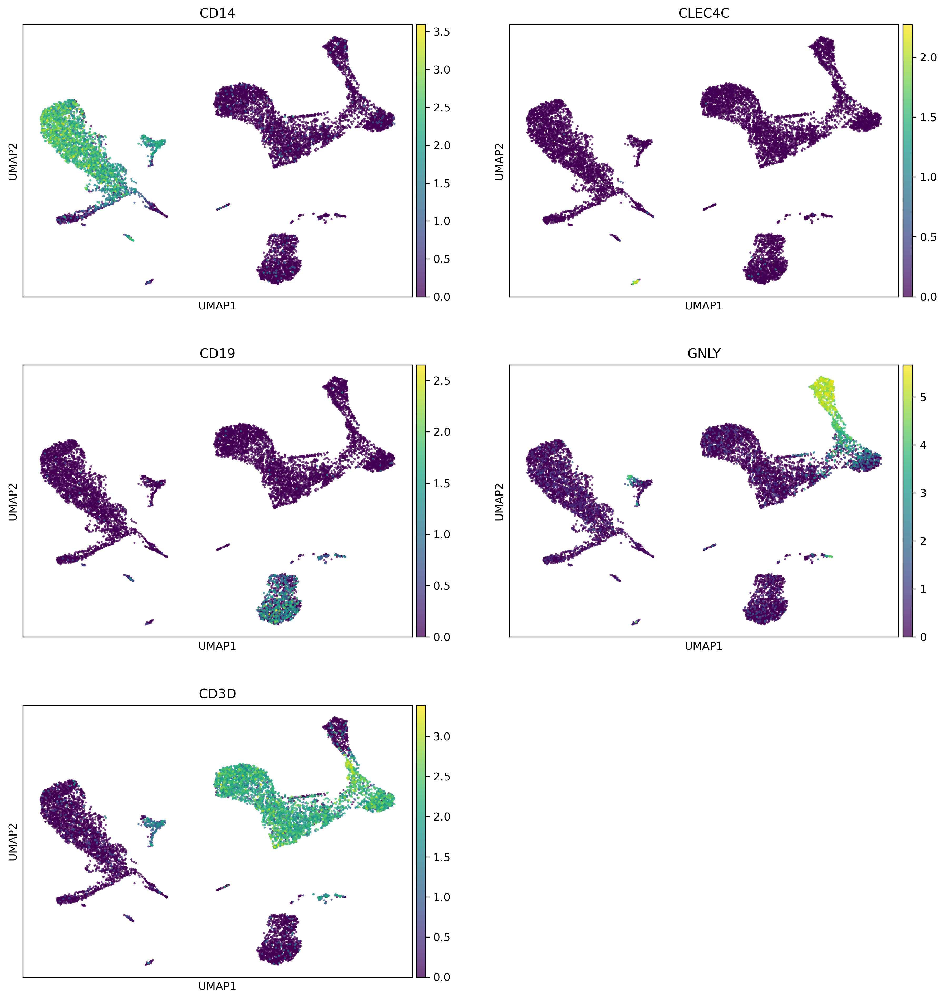

In [92]:
sc.pl.umap(adNorm, color=markerGenes, alpha=.75, s=15, ncols=2)

### Unsupervised clustering

Let's try to assign cells to distinct groups or clusters based on the cell-to-cell distances. Leiden and Louvain are examples of community detection methods that perform this task by searching for the group assignment that maximize within group similarity (which is equivalent to within group edges of a knn graph) and to minimize between group similarity. 


In [93]:
sc.tl.leiden(adNorm,.1)

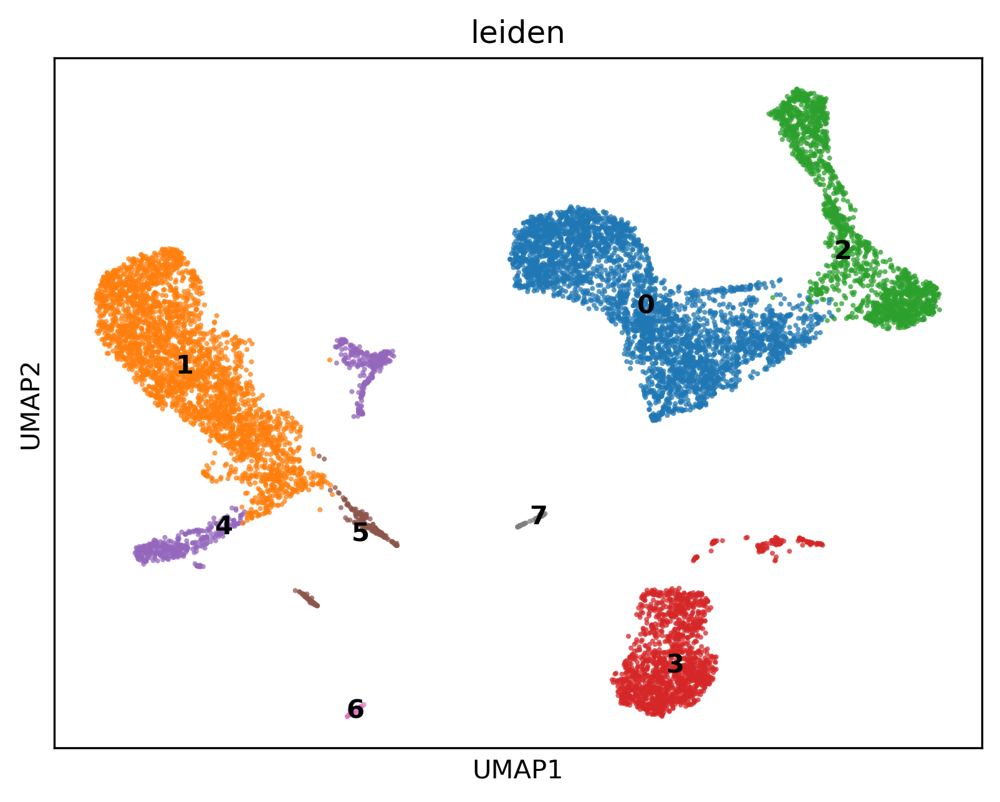

In [94]:
sc.pl.umap(adNorm,color=['leiden'], alpha=.75, s=15, legend_loc='on data')

<div class="alert alert-block alert-success"><b>Discordance</b><br>
Embeddings do not always agree with cluster results! See cluster 4 above, and note in particular one cell from cluster '1' that is embedded next to the island part of cluster '4'. 
</div>

We can try to rectify this by using PAGA, which tries to infer dynamic relationships between clusters, to seed an initial embedding for UMAP that reflects overall cluster similarities.

In the next cell, we call the following functions

`tl.paga()` computes intercluster similarities

`pl.paga()` creates an intial embedding based on this

`tl.umap()` uses this embedding to start its optimization

Let's restart with the cleaned data.

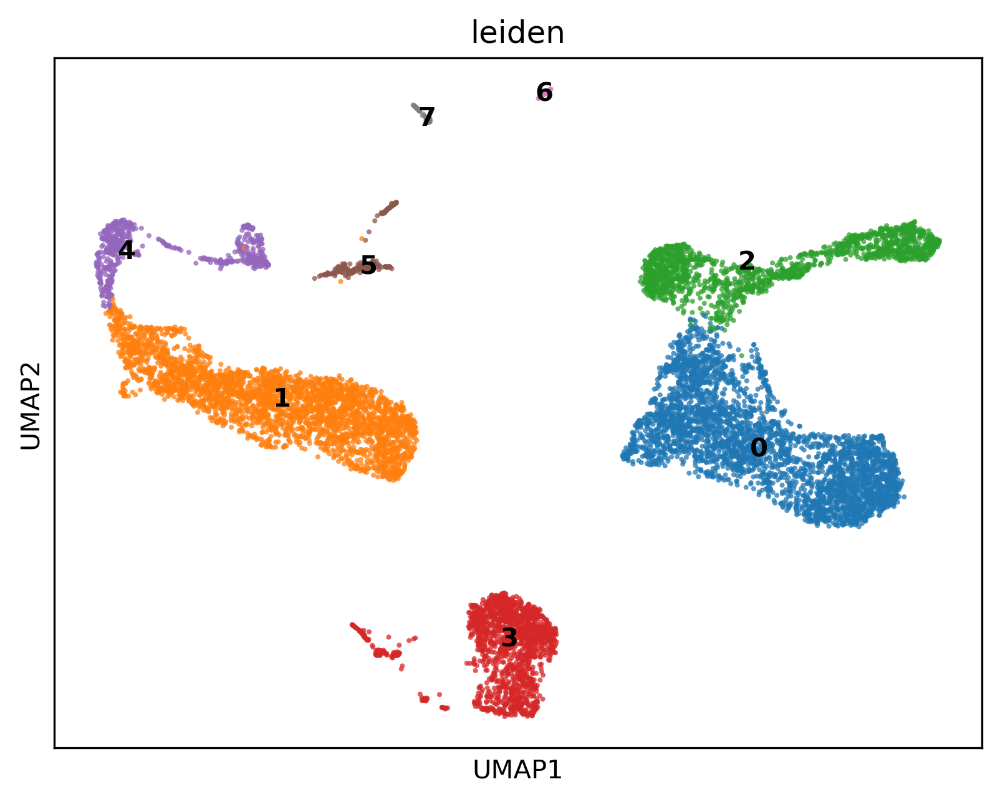

In [111]:
adNorm = adClean.copy()

## Norm, HVG, PCA, kNN
sc.pp.normalize_total(adNorm , target_sum=1e4)
sc.pp.log1p(adNorm)
sc.pp.highly_variable_genes(adNorm , min_mean=0.0125, max_mean=6, min_disp=0.25)
sc.tl.pca(adNorm , use_highly_variable=True)

n_neighbors = 20
n_pcs = 10
sc.pp.neighbors(adNorm, n_neighbors=n_neighbors, n_pcs=n_pcs)
sc.tl.leiden(adNorm,.1)
sc.tl.paga(adNorm)
sc.pl.paga(adNorm, plot=False)
sc.tl.umap(adNorm, 0.25, init_pos='paga')
sc.pl.umap(adNorm,color=['leiden'], alpha=.75, s=15, legend_loc='on data')

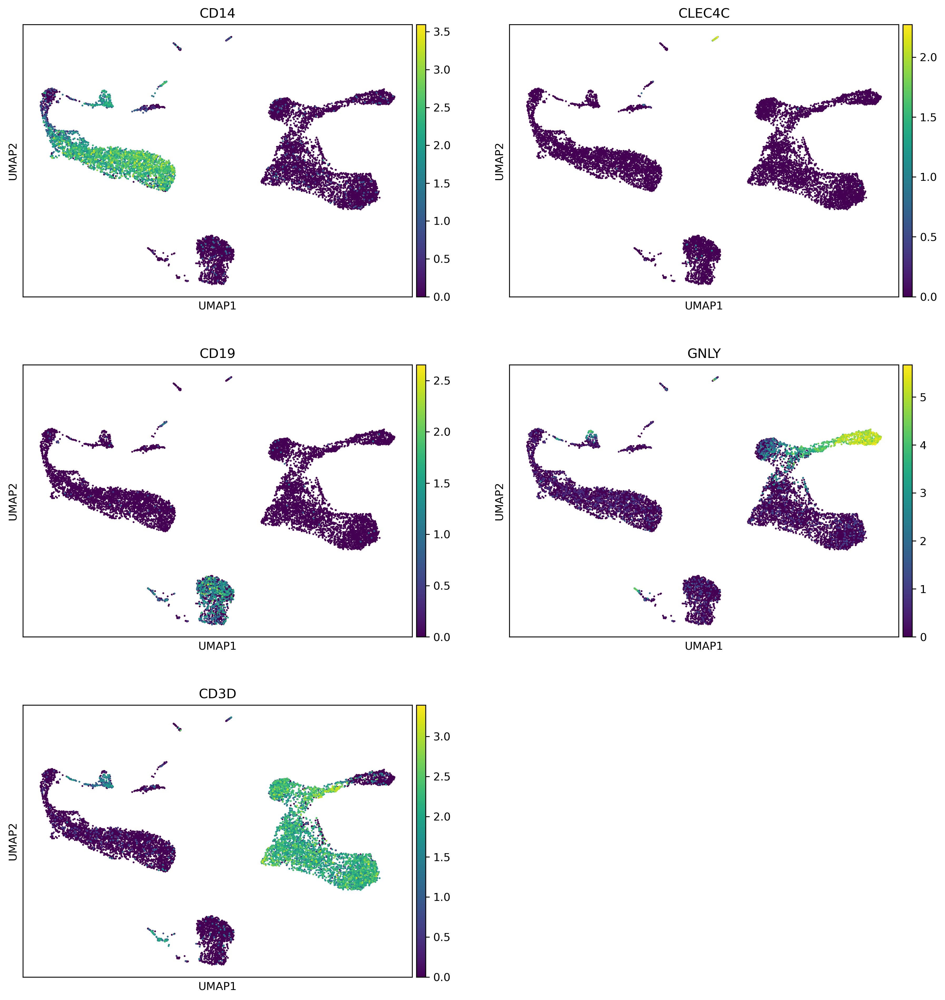

In [112]:
sc.pl.umap(adNorm , color=markerGenes, ncols=2)

Make a figure that shows the embedding and expression of marker genes side-by-side. Note that I am adding markers for T cell, B cell, and Monocyte sub-types

categories: 0, 1, 2, etc.
var_group_labels: B cell, Dendritic, Monocyte, etc.


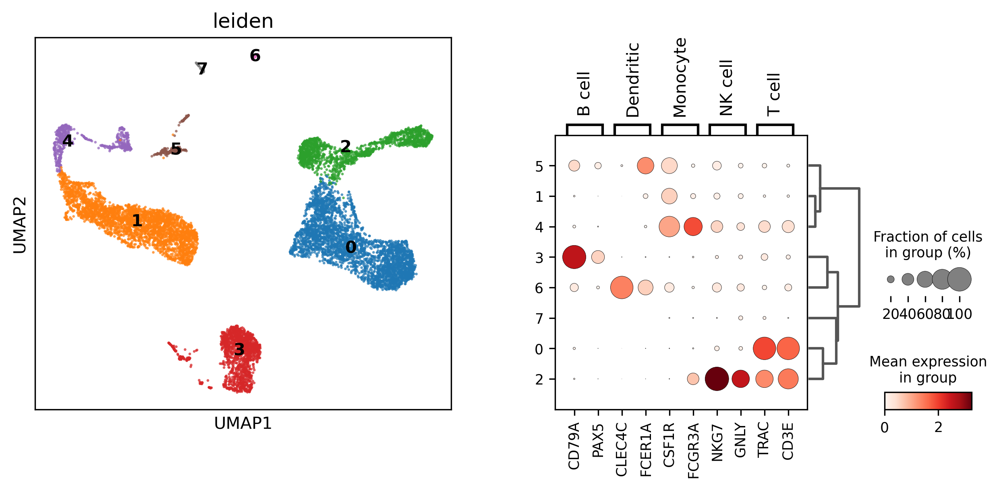

In [114]:
marker_genes_broad_dict = {
    'B cell': ['CD79A', 'PAX5'],
    'Dendritic': ['CLEC4C', 'FCER1A'],
    'Monocyte': ['CSF1R', 'FCGR3A'],
    'NK cell': ['NKG7', 'GNLY'],
    'T cell': ['TRAC', 'CD3E'],
}

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden', dendrogram=True,ax=ax2, show=False)
plt.show()

### Cluster annotation
We can walk down the rows of the dotplot and guess at the cell types of some of these clusters based on the specificty of marker expression:

| cluster | markers  of          | cell type       |
|---------|----------------------|-----------------|
| 5       | B, Dendritic, Mono   | ???             |
| 1       | Monocyte             | Monocyte        |
| 4       | Monocyte, T          | ???            |
| 3       | B                    | B-cell          |
| 6       | Dendritic (B/Mono?)  | Dendritic cell  |
| 7       | none                 | Mystery cell    | 
| 0  | T cell | T cell |
| 2 |  NK/T | ??? |

Some clusters are ambiguous because they express markers of more than one cell type. This could be due to the cluster containing > 1 cell type, or because the cell barcodes are doublets. If the former, then we should be able to sub cluster them. Let's try this.

Clusters to refine are 5, 4, and 2.

categories: 0, 1, 2, etc.
var_group_labels: B cell, Dendritic, Monocyte, etc.


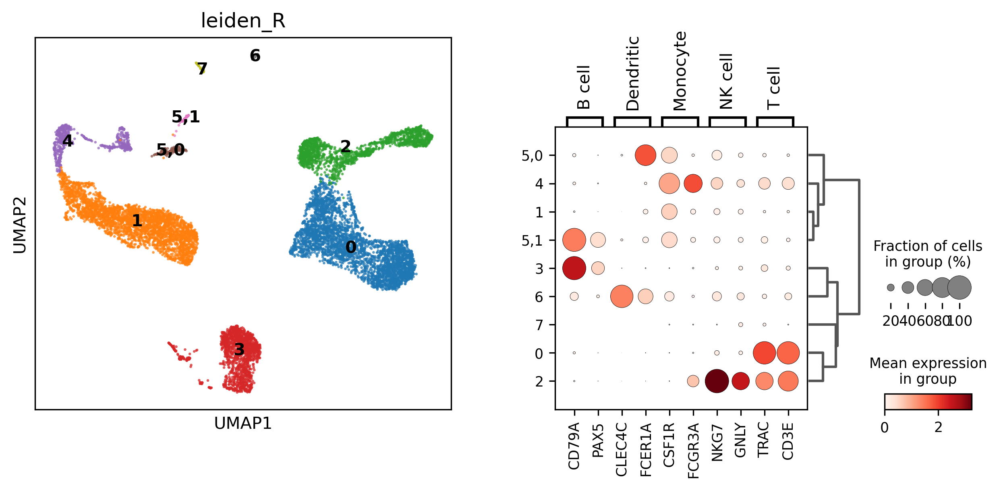

In [115]:
sc.tl.leiden(adNorm,.1, restrict_to=["leiden",["5"]])
sc.tl.dendrogram(adNorm, "leiden_R")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()

Cluster 5 is split into 2 clusters now. Both of these sub-clusters express the Monocyte marker CD14, but are distinguished by their expression of dendritic marker FCER1A and the B cell genes CD79A and PAX5. Let's look at the QC metrics to see if that can give us additional hints as to whether these are real cells or are doublets.

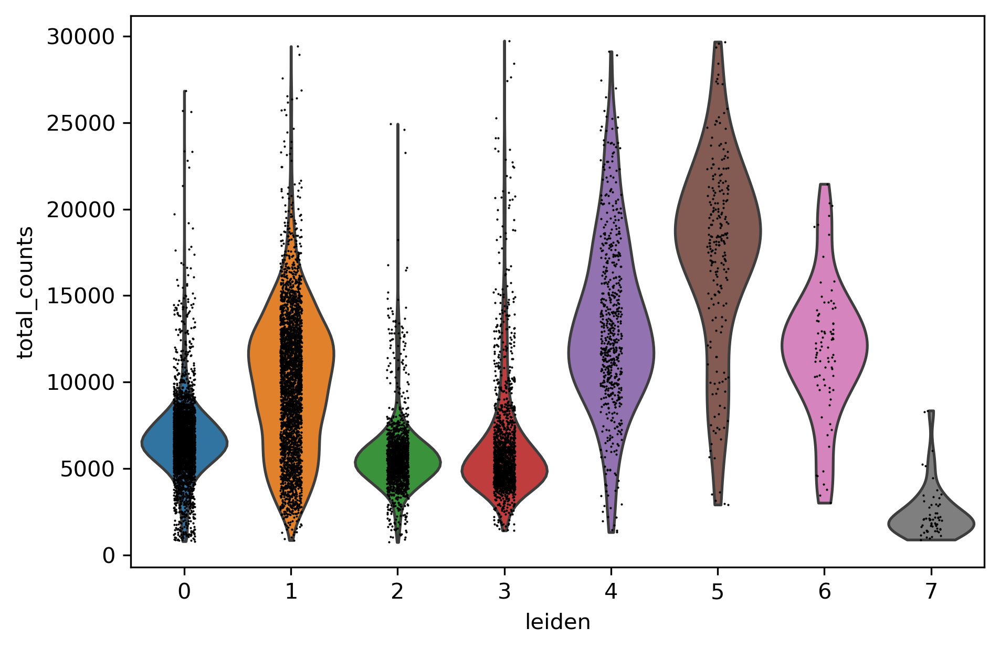

In [116]:
sc.pl.violin(adNorm, ['total_counts'], groupby='leiden' )

Cluster 5 has a high number of Total counts. So let's annotate these as 'doublet'. 

What about the other questionable clusters 4 and 2? Can we refine those?

categories: 0, 1, 2,0, etc.
var_group_labels: B cell, Dendritic, Monocyte, etc.


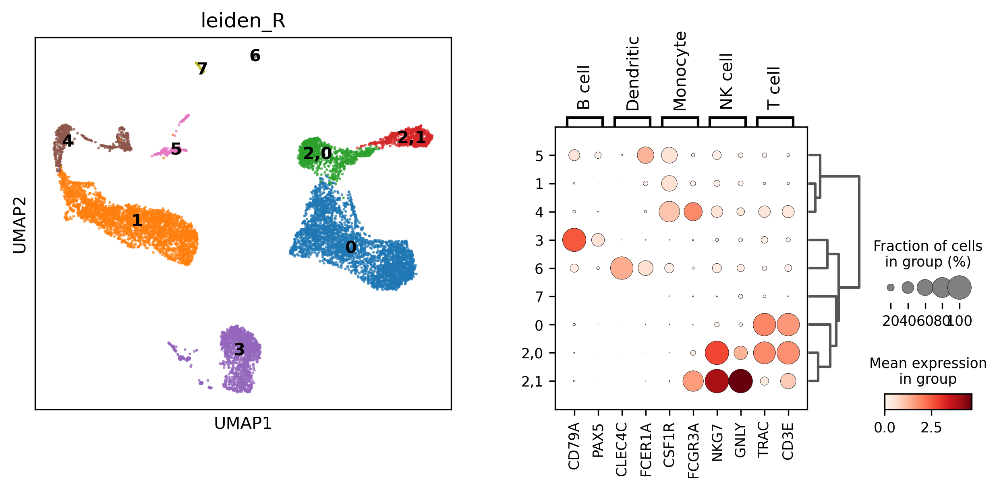

In [117]:
sc.tl.leiden(adNorm,.1, restrict_to=["leiden",["2"]])
sc.tl.dendrogram(adNorm, "leiden_R")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()

It looks like 2,0 is T cell, and 2,1 is Natural Killer cell.
Note that 2,0 still has a distinct profile as compared to 0. 

What about cluster 4? And this time, when we do the sub-clustering, let's keep the way that we split up cluster 2.

categories: 0, 1, 2,0, etc.
var_group_labels: B cell, Dendritic, Monocyte, etc.


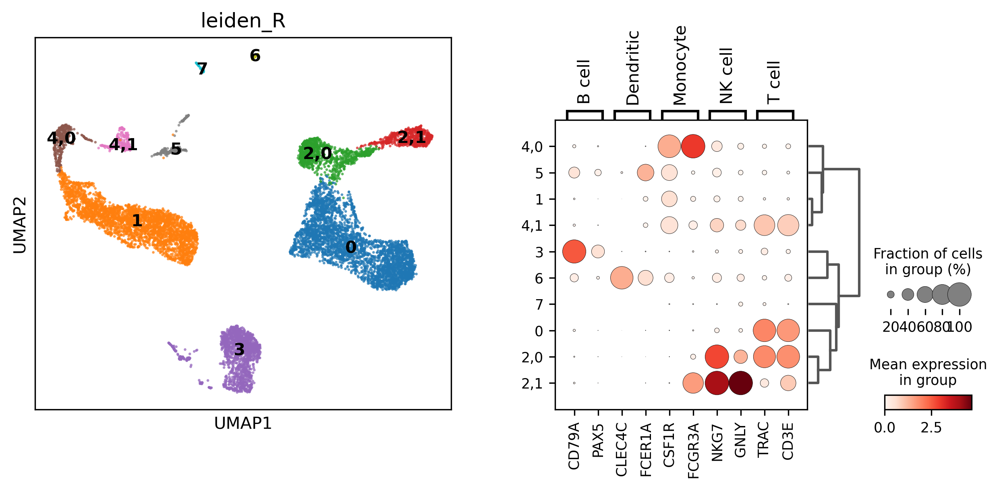

In [118]:
sc.tl.leiden(adNorm,.1, restrict_to=["leiden_R",["4"]])
sc.tl.dendrogram(adNorm, "leiden_R")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()

Is 4,1 multiplet?

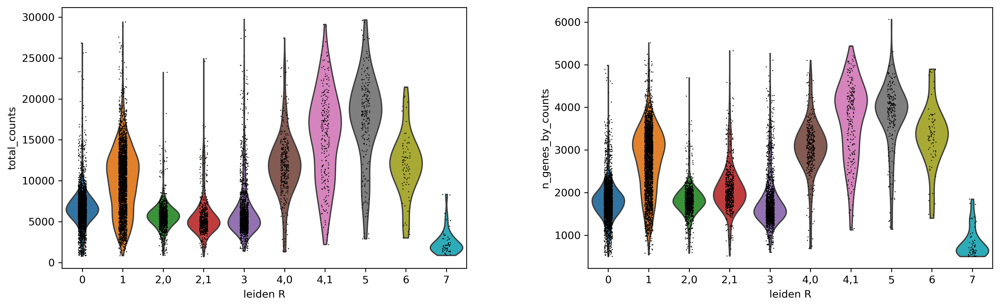

In [119]:
sc.pl.violin(adNorm, ['total_counts', 'n_genes_by_counts'], groupby='leiden_R' )

Yes, it looks like 4,1 is similar in these QC profiles to cluster 5.

So our updated annotation table is now:

| cluster | markers  of          | cell type       |
|---------|----------------------|-----------------|
| 5       | B, Dendritic, Mono   | doublet            |
| 1       | Monocyte             | Monocyte        |
| 4,0     | Monocyte           | Monocyte       |
| 3       | B                    | B-cell          |
| 6       | Dendritic (B/Mono?)  | Dendritic cell  |
| 7       | none                 | Mystery cell    | 
| 0  | T cell | T cell |
| 2,0  | T cell | T cell |
| 2,1 |  NK cell | NK cell |

Why do we have two Monocyte clusters and two T cells clusters?

categories: 0, 1, 2,0, etc.
var_group_labels: B cell, Dendritic, CD14 monocyte, etc.


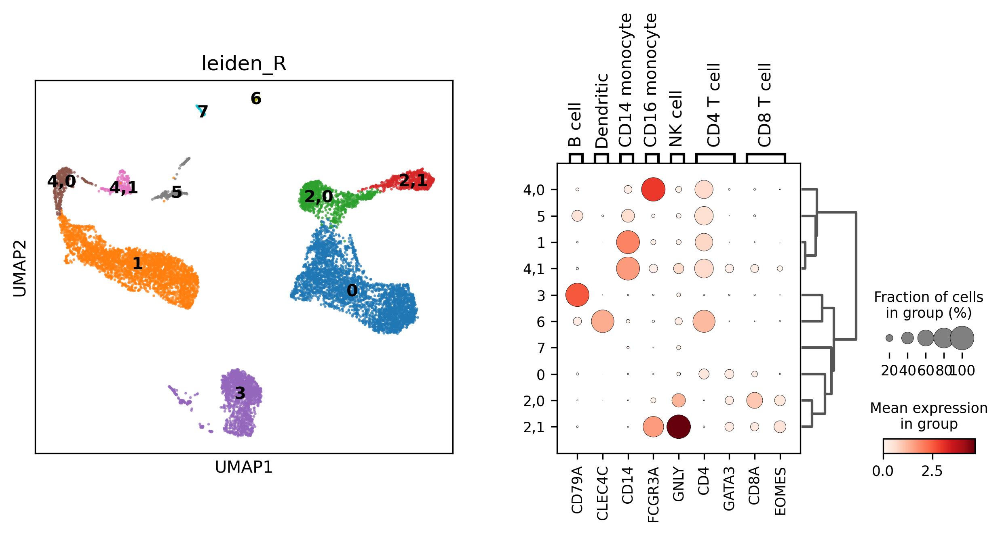

In [120]:
marker_genes_sub_dict = {
    'B cell': ['CD79A'],
    'Dendritic': ['CLEC4C'],
    'CD14 monocyte': ['CD14'],
    'CD16 monocyte': ['FCGR3A'],
    'NK cell': ['GNLY'],
    'CD4 T cell': ['CD4', 'GATA3'],
    'CD8 T cell': ['CD8A', 'EOMES']
}

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_sub_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()

We are close to a final annotation now:

| cluster | markers  of          | cell type       |
|---------|----------------------|-----------------|
| 5       | B, Dendritic, Mono   | doublet            |
| 1       | Monocyte             | CD14 Monocyte        |
| 4,0     | Monocyte           | CD16 Monocyte       |
| 3       | B                    | B-cell          |
| 6       | Dendritic (B/Mono?)  | Dendritic cell  |
| 7       | none                 | Mystery cell    | 
| 0  | T cell | CD4 T cell |
| 2,0  | T cell | CD8 T cell |
| 2,1 |  NK cell | NK cell |

But what is cluster 7? It has low counts. If it is just ambient 'soup', then we would not expect it to have high levels of cell type specific genes. Let's do differential gene expression analysis to see what is upregulated in this cluster.

### Differential gene expression

In [121]:
sc.tl.rank_genes_groups(adNorm, use_raw=False, groupby="leiden_R")

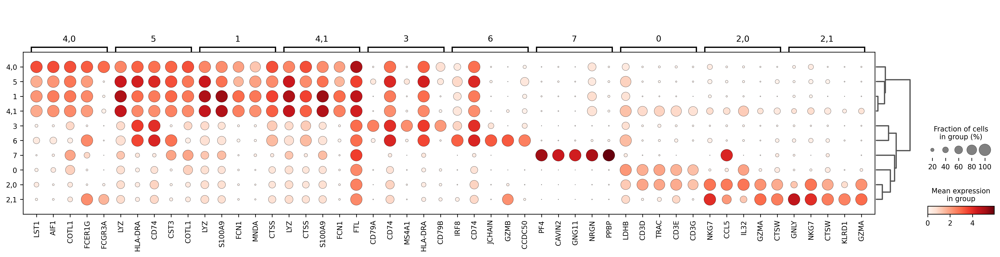

In [124]:
sc.pl.rank_genes_groups_dotplot(adNorm, n_genes=5, groupby="leiden_R", dendrogram=True, key='rank_genes_groups')

categories: 0, 1, 2,0, etc.
var_group_labels: 7


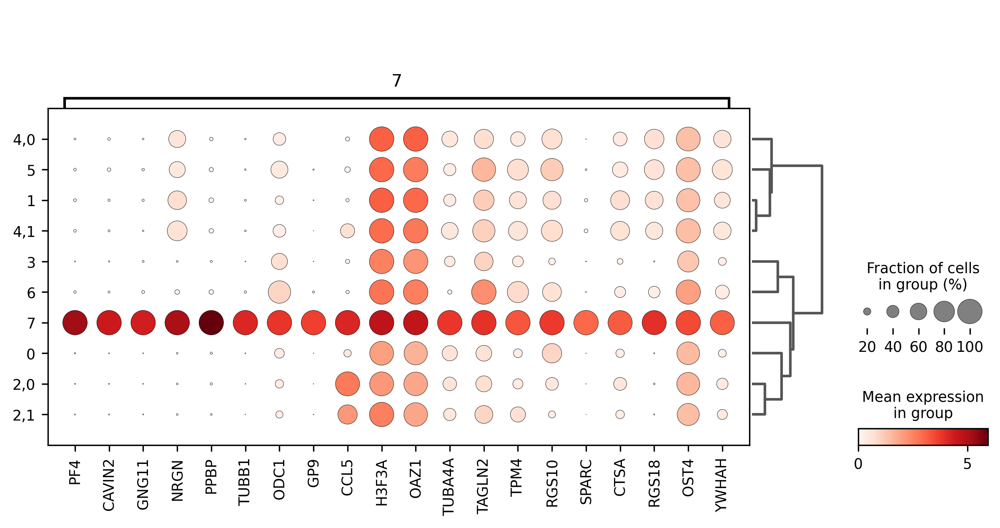

In [125]:
sc.pl.rank_genes_groups_dotplot(adNorm, n_genes=20, groupby="leiden_R", dendrogram=True, key='rank_genes_groups', groups=['7'])

Although this result could be refined and explored a lot, it is sufficient for us to address our question about the identity of cluster 7 as follows:

<figure>
    <img src="./img/ChatGPT_cellguess.png" alt="Help from ChatGPT" width="600">
    <figcaption>Help from ChatGPT to annotate cells</figcaption>
</figure>


Now, let's add the annotation to the anndata.obs and discard the other cells

| cluster | markers  of          | cell type       |
|---------|----------------------|-----------------|
| 1       | Monocyte             | CD14 Monocyte        |
| 4,0     | Monocyte           | CD16 Monocyte       |
| 3       | B                    | B-cell          |
| 6       | Dendritic (B/Mono?)  | Dendritic cell  |
| 7       | none                 | Platelet    | 
| 0  | T cell | CD4 T cell |
| 2,0  | T cell | CD8 T cell |
| 2,1 |  NK cell | NK cell |



In [134]:
tokeep = ["1", "4,0", "3", "6", "7", "0", "2,0", "2,1"]
adNorm2 = adNorm.copy()
adNorm2 = adNorm2[adNorm2.obs['leiden_R'].isin(tokeep)].copy()
adNorm2.shape
adNorm2.obs['leiden_R'].value_counts()

leiden_R
0      3562
1      3115
3      1604
2,0    1032
2,1     611
4,0     368
6        81
7        60
Name: count, dtype: int64

In [135]:
cell_dict = {'Dendritic': ['6'],
             'CD14 Monocyte': ['1'],
             'CD16 Monocyte': ["4,0"],
             'B cell': ['3'],
             'Platelet': ['7'],
             'CD4 T cell': ['0'],
             'CD8 T cell': ["2,0"],
             'NK cell': ["2,1"]
}

new_obs_name = 'cell_type'
adNorm2.obs[new_obs_name] = np.nan

for i in cell_dict.keys():
    ind = pd.Series(adNorm2.obs.leiden_R).isin(cell_dict[i])
    adNorm2.obs.loc[ind,new_obs_name] = i

adNorm2.obs['cell_type'] = adNorm2.obs['cell_type'].astype("category") 


categories: B cell, CD14 Monocyte, CD16 Monocyte, etc.
var_group_labels: B cell, Dendritic, Monocyte, etc.


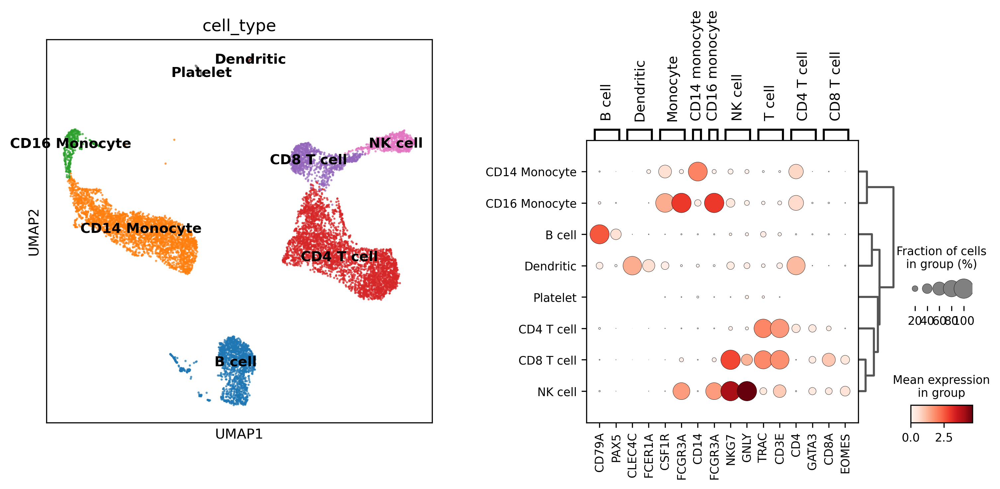

In [136]:
sc.tl.dendrogram(adNorm2, "cell_type")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,5), gridspec_kw={'wspace':0.4})
ax1_dict = sc.pl.umap(adNorm2,color=['cell_type'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm2, marker_genes_dict, 'cell_type', dendrogram=True,ax=ax2, show=False)
plt.show()


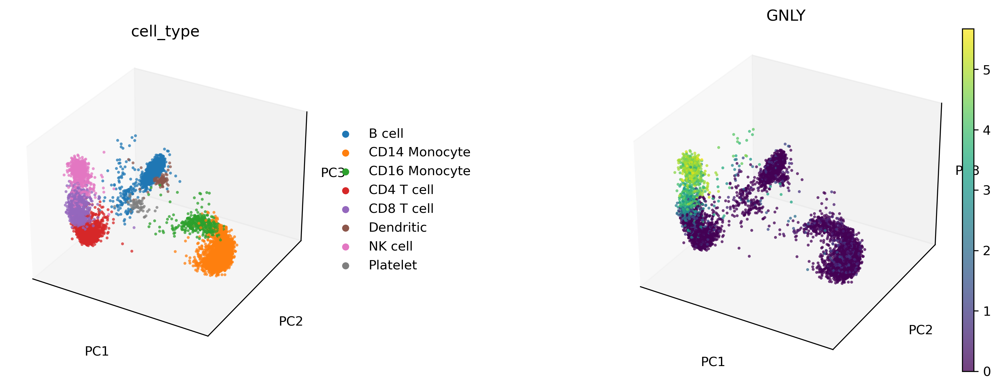

In [137]:
sc.pl.pca(adNorm2, color=['cell_type', 'GNLY'], alpha=.75, s=15, projection='3d')

#### Differential expression analysis
Let's identify genes that are preferenntially expressed in each cluster versus all the others as a final step to annotate these clusters and to remove ones that are likely to be doublets.

In [138]:
sc.tl.rank_genes_groups(adNorm2, use_raw=False, groupby="cell_type")

##### Dot plot of differentially expressed genes
First, we will apply a filter so that we only display genes that meet additional criteria beyond statistical: fold change, % expressed in cluster, % expressed in other cells

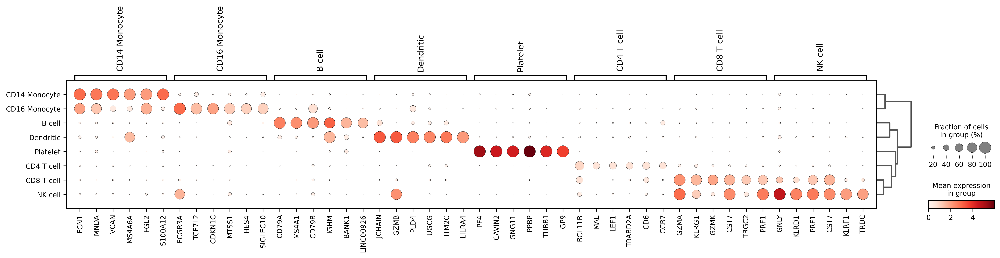

In [139]:
sc.tl.filter_rank_genes_groups(adNorm2, min_fold_change=.7, min_in_group_fraction=.5, max_out_group_fraction=.15)
sc.pl.rank_genes_groups_dotplot(adNorm2, n_genes=6, groupby="cell_type", dendrogram=True, key='rank_genes_groups_filtered')

### Resources

#### Tools
- Colab
	- https://colab.research.google.com/
- Jupyter
	- https://jupyter.org/
- CellRanger
	- https://www.10xgenomics.com/support/software/cell-ranger/latest/advanced/cr-barcode-rank-plot
	- https://www.10xgenomics.com/support/software/cell-ranger/latest/algorithms-overview/cr-gex-algorithm

#### Literature
- Best practices
    - [best practices in sc analysis online book](https://www.sc-best-practices.org/preamble.html)
	- [paper associated with the above online book](https://www.embopress.org/doi/full/10.15252/msb.20188746)
- Scanpy
	- https://scanpy.readthedocs.io/en/stable/
	- https://scanpy.readthedocs.io/en/stable/tutorials.html
    - https://scanpy-tutorials.readthedocs.io/en/latest/pbmc3k.html
    - https://scanpy-tutorials.readthedocs.io/en/latest/plotting/advanced.html
    - https://scanpy-tutorials.readthedocs.io/en/latest/plotting/core.html
- AnnData
	- https://anndata.readthedocs.io/en/latest/tutorials/notebooks/getting-started.html
	- https://anndata.readthedocs.io/en/latest/index.html
- QC
	- https://genomebiology.biomedcentral.com/articles/10.1186/s13059-020-02136-7